In [68]:
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
from sympy.utilities import lambdify
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

sp.init_printing()

In [47]:
x = sp.Symbol('x', real = True)
k = sp.Symbol('k', real = True, positive = True)
a = sp.Symbol('a', real = True)
n = sp.Symbol('n', integer = True)
t = sp.Symbol('t', real = True, positive = True)
m = sp.Symbol('m', real = True, positive = True)
h = sp.Symbol('hbar', real = True, positive = True)
psi = sp.Function('\psi')

x,k,a,psi(x), n, m, h

In [6]:
(x**2 + sp.sin(x)).diff(x)

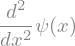

In [18]:
psi(x).diff(x,x)

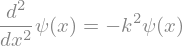

In [22]:
eq = sp.Eq(psi(x).diff(x,x), -k**2 * psi(x))
eq

In [29]:
sol = sp.dsolve(eq,psi(x), ics = {psi(0): 0})
sol

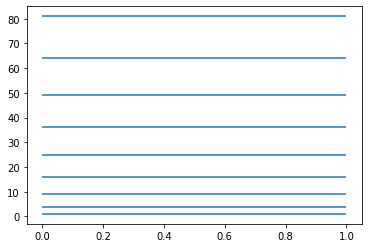

In [26]:
plt.hlines(np.arange(1,10)**2,0,1)

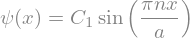

In [31]:
sol2 = sol.subs(k, n * sp.pi / a)
sol2

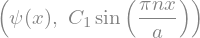

In [42]:
sol2.lhs, sol2.rhs

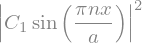

In [41]:
sp.Abs(sol2.rhs)**2

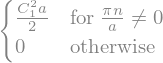

In [43]:
sp.integrate(sol2.rhs**2, (x,0,a))

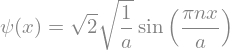

In [105]:
sol2 = sol2.subs(sp.Symbol('C1'), sp.sqrt(2/a))
sol2

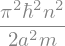

In [46]:
n**2 * sp.pi**2 * h**2 / (2 * m * a**2)

In [48]:
sp.exp(-sp.I * n**2 * sp.pi**2 * h**2 / (2 * m * a**2) * t / h)

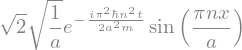

In [51]:
Psi = sol2.rhs * sp.exp(-sp.I * n**2 * sp.pi**2 * h**2 / (2 * m * a**2) * t / h)
Psi

In [54]:
Psif = lambdify((x,t,n), Psi.subs({h: 1, m: 1, a:1}))

In [55]:
Psif(0.3,2.3,1)

(0.3971182633717983+1.0729930471683005j)

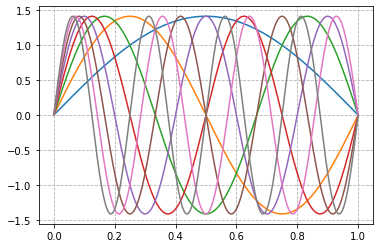

In [66]:
xs = np.linspace(0,1,1000)
ys = Psif(xs, 0, 1).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 2).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 3).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 4).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 5).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 6).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 7).real
plt.plot(xs,ys)

ys = Psif(xs, 0, 8).real
plt.plot(xs,ys)

plt.grid(linestyle = '--')

In [78]:
n = 4

fig = plt.figure()

plt.xlim(0,1)
plt.ylim(-1.5,1.5)

plot1, = plt.plot([], [])
plot2, = plt.plot([], [])

plt.close()

dt = 0.001

def frame(i):
    t = i * dt

    ys = Psif(xs, t, n)
    ys1 = ys.real
    ys2 = ys.imag

    plot1.set_data(xs, ys1)
    plot2.set_data(xs, ys2)
    return plot1, plot2

anim = FuncAnimation(fig, frame, 300, interval = 20, blit = True)

HTML(anim.to_jshtml())

In [88]:
fig = plt.figure()

plt.xlim(0,1)
plt.ylim(0,6)

plt.grid(linestyle = '--')

plot1, = plt.plot([], [])

plt.close()

dt = 0.001

def frame(i):
    t = i * dt

    ys = (Psif(xs, t, 1) + Psif(xs, t, 2) + Psif(xs, t, 3) + Psif(xs, t, 4)) / np.sqrt(4)


    plot1.set_data(xs, np.abs(ys)**2)
    return plot1,

anim = FuncAnimation(fig, frame, 300, interval = 20, blit = True)

HTML(anim.to_jshtml())

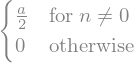

In [94]:
sp.integrate(sol2.rhs * x * sol2.rhs, (x, 0, a))

In [96]:
p = -1 * sp.I * h.diff(x)
p

In [114]:
sp.integrate(sol2.rhs * (-1 * sp.I * h) * (sol2.rhs).diff(x), (x,0,a))

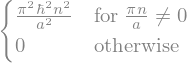

In [113]:
sp.integrate( sol2.rhs * (-1 * h**2) * (sol2.rhs).diff(x,x), (x, 0, a))